In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import LabelEncoder
import missingno as msno
import plotly.express as px
from sklearn.ensemble import RandomForestClassifier , AdaBoostClassifier , VotingClassifier
import xgboost as xgb
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score , precision_score , recall_score , classification_report
from sklearn.metrics import confusion_matrix , mean_squared_error
from sklearn.model_selection import GridSearchCV , RandomizedSearchCV , cross_val_score ,cross_val_predict 



In [3]:
df=pd.read_csv("/kaggle/input/diabetes-dataset/diabetes.csv")
df


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000,1.00000,3.0000,6.00000,17.00
Glucose,768.0,120.894531,31.972618,0.000,99.00000,117.0000,140.25000,199.00
BloodPressure,768.0,69.105469,19.355807,0.000,62.00000,72.0000,80.00000,122.00
SkinThickness,768.0,20.536458,15.952218,0.000,0.00000,23.0000,32.00000,99.00
Insulin,768.0,79.799479,115.244002,0.000,0.00000,30.5000,127.25000,846.00
BMI,768.0,31.992578,7.884160,0.000,27.30000,32.0000,36.60000,67.10
DiabetesPedigreeFunction,768.0,0.471876,0.331329,0.078,0.24375,0.3725,0.62625,2.42
Age,768.0,33.240885,11.760232,21.000,24.00000,29.0000,41.00000,81.00
Outcome,768.0,0.348958,0.476951,0.000,0.00000,0.0000,1.00000,1.00


In [7]:
df.isnull()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...
763,False,False,False,False,False,False,False,False,False
764,False,False,False,False,False,False,False,False,False
765,False,False,False,False,False,False,False,False,False
766,False,False,False,False,False,False,False,False,False


In [8]:
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [10]:
df.mean()

Pregnancies                   3.845052
Glucose                     120.894531
BloodPressure                69.105469
SkinThickness                20.536458
Insulin                      79.799479
BMI                          31.992578
DiabetesPedigreeFunction      0.471876
Age                          33.240885
Outcome                       0.348958
dtype: float64

In [12]:
df.shape

(768, 9)

In [14]:
df.sample(10)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
8,2,197,70,45,543,30.5,0.158,53,1
616,6,117,96,0,0,28.7,0.157,30,0
759,6,190,92,0,0,35.5,0.278,66,1
611,3,174,58,22,194,32.9,0.593,36,1
653,2,120,54,0,0,26.8,0.455,27,0
676,9,156,86,0,0,24.8,0.230,53,1
303,5,115,98,0,0,52.9,0.209,28,1
291,0,107,62,30,74,36.6,0.757,25,1
233,4,122,68,0,0,35.0,0.394,29,0
650,1,91,54,25,100,25.2,0.234,23,0


In [17]:
df.head(10).style.background_gradient(cmap="Blues")

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.600000,0.627000,50,1
1,1,85,66,29,0,26.600000,0.351000,31,0
2,8,183,64,0,0,23.300000,0.672000,32,1
3,1,89,66,23,94,28.100000,0.167000,21,0
4,0,137,40,35,168,43.100000,2.288000,33,1
5,5,116,74,0,0,25.600000,0.201000,30,0
6,3,78,50,32,88,31.000000,0.248000,26,1
7,10,115,0,0,0,35.300000,0.134000,29,0
8,2,197,70,45,543,30.500000,0.158000,53,1
9,8,125,96,0,0,0.000000,0.232000,54,1


In [18]:
df.tail(10)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
758,1,106,76,0,0,37.5,0.197,26,0
759,6,190,92,0,0,35.5,0.278,66,1
760,2,88,58,26,16,28.4,0.766,22,0
761,9,170,74,31,0,44.0,0.403,43,1
762,9,89,62,0,0,22.5,0.142,33,0
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1
767,1,93,70,31,0,30.4,0.315,23,0


In [82]:
df_corr =df.corr()
df_corr

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
Pregnancies,1.000000,0.129459,0.141282,-0.081672,-0.073535,0.017683,-0.033523,0.544341,0.221898
Glucose,0.129459,1.000000,0.152590,0.057328,0.331357,0.221071,0.137337,0.263514,0.466581
BloodPressure,0.141282,0.152590,1.000000,0.207371,0.088933,0.281805,0.041265,0.239528,0.065068
SkinThickness,-0.081672,0.057328,0.207371,1.000000,0.436783,0.392573,0.183928,-0.113970,0.074752
Insulin,-0.073535,0.331357,0.088933,0.436783,1.000000,0.197859,0.185071,-0.042163,0.130548
BMI,0.017683,0.221071,0.281805,0.392573,0.197859,1.000000,0.140647,0.036242,0.292695
DiabetesPedigreeFunction,-0.033523,0.137337,0.041265,0.183928,0.185071,0.140647,1.000000,0.033561,0.173844
Age,0.544341,0.263514,0.239528,-0.113970,-0.042163,0.036242,0.033561,1.000000,0.238356
Outcome,0.221898,0.466581,0.065068,0.074752,0.130548,0.292695,0.173844,0.238356,1.000000


In [20]:
df[df["Age"] == df["BMI"]].sum()

Pregnancies                  16.000
Glucose                     424.000
BloodPressure               298.000
SkinThickness               125.000
Insulin                     154.000
BMI                         110.000
DiabetesPedigreeFunction      0.988
Age                         110.000
Outcome                       2.000
dtype: float64

In [21]:
df["Insulin"].value_counts()

Insulin
0      374
105     11
130      9
140      9
120      8
      ... 
73       1
171      1
255      1
52       1
112      1
Name: count, Length: 186, dtype: int64

In [22]:
df.groupby("BMI")["Insulin"].max()

BMI
0.0      89
18.2     82
18.4      0
19.1      0
19.3     64
       ... 
53.2    100
55.0     99
57.3    240
59.4     14
67.1    130
Name: Insulin, Length: 248, dtype: int64

In [29]:
df["Glucose"].sort_values(ascending=False).head(14)

661    199
561    198
228    197
8      197
579    197
408    197
359    196
22     196
206    196
675    195
498    195
489    194
185    194
319    194
Name: Glucose, dtype: int64

In [24]:
df.duplicated()

0      False
1      False
2      False
3      False
4      False
       ...  
763    False
764    False
765    False
766    False
767    False
Length: 768, dtype: bool

In [25]:
df["BloodPressure"].unique()

array([ 72,  66,  64,  40,  74,  50,   0,  70,  96,  92,  80,  60,  84,
        30,  88,  90,  94,  76,  82,  75,  58,  78,  68, 110,  56,  62,
        85,  86,  48,  44,  65, 108,  55, 122,  54,  52,  98, 104,  95,
        46, 102, 100,  61,  24,  38, 106, 114])

In [28]:
df["BloodPressure"].max()

122

In [32]:
df[df["Insulin"] == df["BMI"].min()]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
5,5,116,74,0,0,25.6,0.201,30,0
7,10,115,0,0,0,35.3,0.134,29,0
...,...,...,...,...,...,...,...,...,...
761,9,170,74,31,0,44.0,0.403,43,1
762,9,89,62,0,0,22.5,0.142,33,0
764,2,122,70,27,0,36.8,0.340,27,0
766,1,126,60,0,0,30.1,0.349,47,1


In [33]:
df.sum()

Pregnancies                  2953.000
Glucose                     92847.000
BloodPressure               53073.000
SkinThickness               15772.000
Insulin                     61286.000
BMI                         24570.300
DiabetesPedigreeFunction      362.401
Age                         25529.000
Outcome                       268.000
dtype: float64

In [43]:
correlation = df.corr()[["Insulin","BMI"]]
correlation

,Insulin,BMI
Pregnancies,-0.073535,0.017683
Glucose,0.331357,0.221071
BloodPressure,0.088933,0.281805
SkinThickness,0.436783,0.392573
Insulin,1.000000,0.197859
BMI,0.197859,1.000000
DiabetesPedigreeFunction,0.185071,0.140647
Age,-0.042163,0.036242
Outcome,0.130548,0.292695


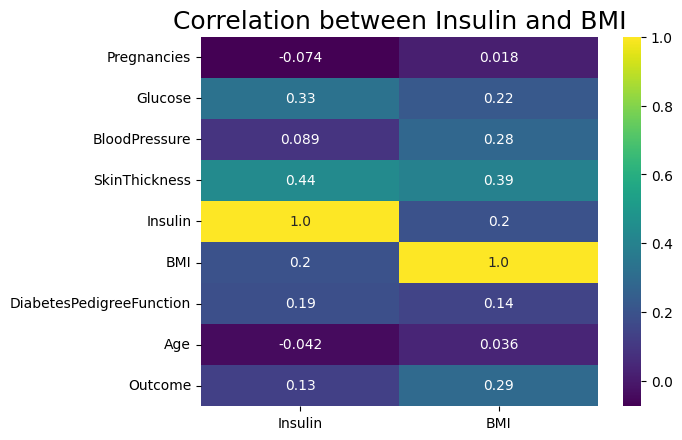

In [44]:
sns.heatmap(correlation , annot = True , fmt = ".2" , cmap ="viridis")
plt.title("Correlation between Insulin and BMI" , fontsize = 18 , c="k")
plt.show()

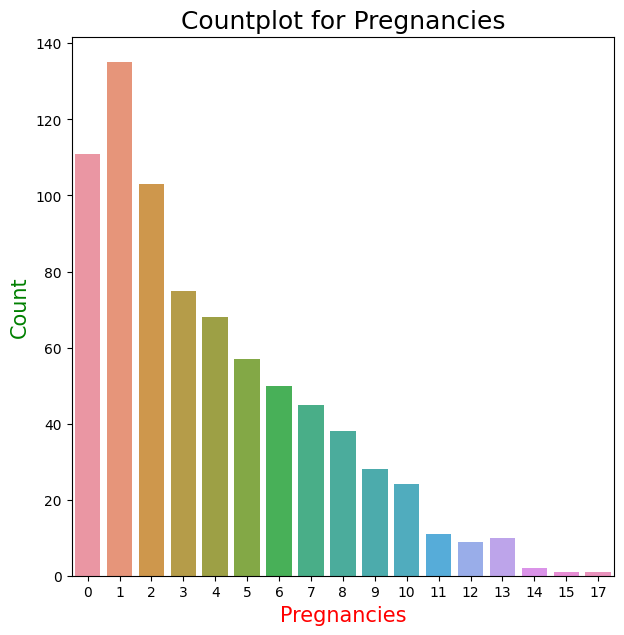

In [56]:
plt.figure(figsize=(7,7))
sns.countplot(x="Pregnancies", data=df)
plt.title("Countplot for Pregnancies" , fontsize = 18 , c="k")
plt.xlabel("Pregnancies" , fontsize = 15 , c="r")
plt.ylabel("Count" , fontsize = 15 , c="g")
plt.show()

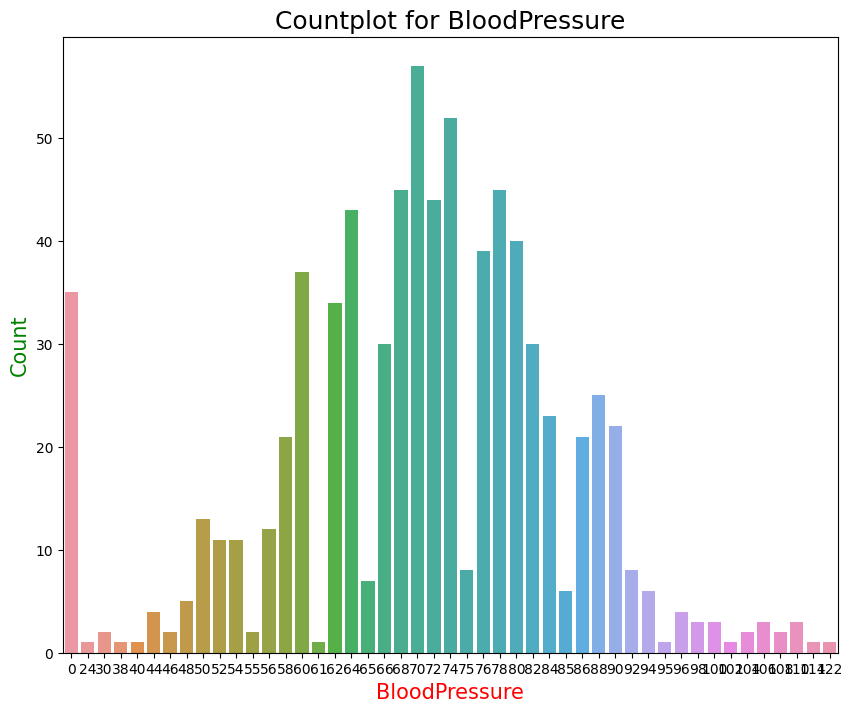

In [59]:
plt.figure(figsize=(10,8))
sns.countplot(x="BloodPressure", data=df)
plt.title("Countplot for BloodPressure" , fontsize = 18 , c="k")
plt.xlabel("BloodPressure" , fontsize = 15 , c="r")
plt.ylabel("Count" , fontsize = 15 , c="g")
plt.show()

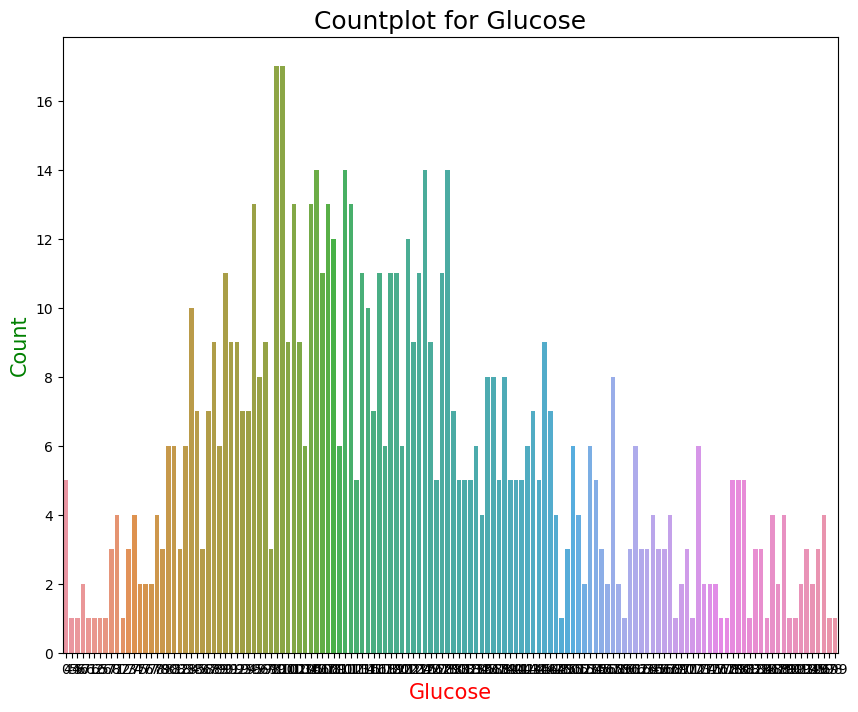

In [64]:
plt.figure(figsize=(10,8))
sns.countplot(x="Glucose", data=df)
plt.title("Countplot for Glucose" , fontsize = 18 , c="k")
plt.xlabel("Glucose" , fontsize = 15 , c="r")
plt.ylabel("Count" , fontsize = 15 , c="g")
plt.show()

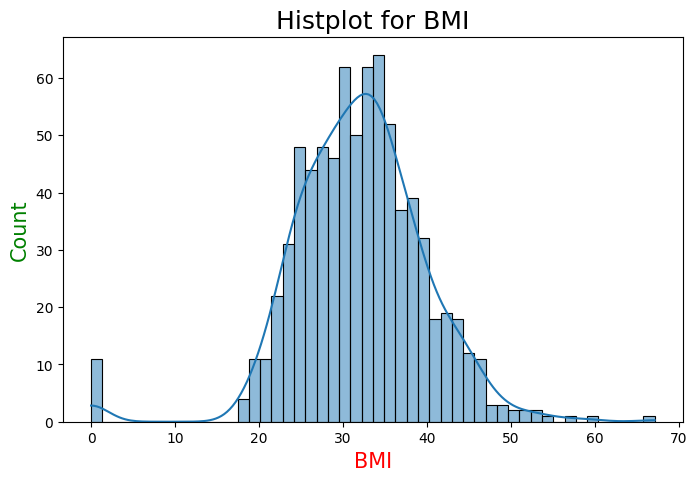

In [68]:
plt.figure(figsize=(8,5))
sns.histplot(x="BMI" , data=df , kde=True , bins=50)
plt.title("Histplot for BMI" , fontsize = 18 , c="k")
plt.xlabel("BMI" , fontsize = 15 , c="r")
plt.ylabel("Count" , fontsize = 15 , c="g")
plt.show()

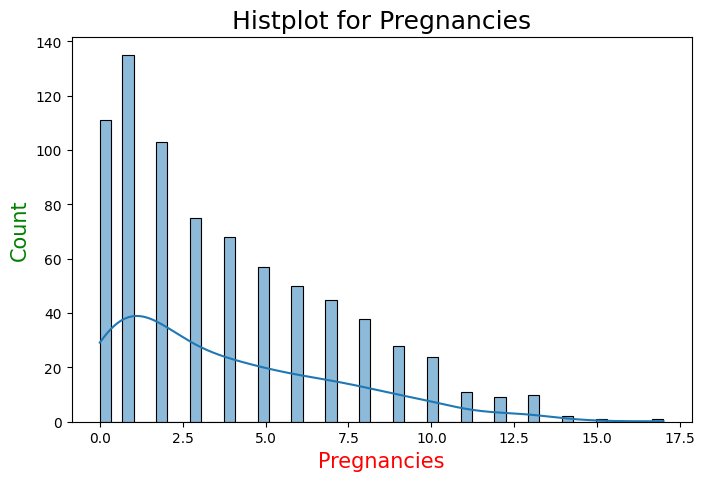

In [70]:
plt.figure(figsize=(8,5))
sns.histplot(x="Pregnancies" , data=df , kde=True , bins=50)
plt.title("Histplot for Pregnancies" , fontsize = 18 , c="k")
plt.xlabel("Pregnancies" , fontsize = 15 , c="r")
plt.ylabel("Count" , fontsize = 15 , c="g")
plt.show()

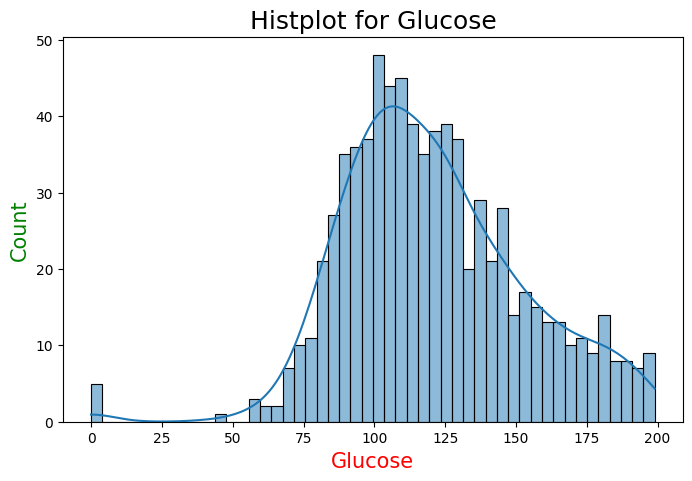

In [73]:
plt.figure(figsize=(8,5))
sns.histplot(x="Glucose" , data=df , kde=True , bins=50)
plt.title("Histplot for Glucose" , fontsize = 18 , c="k")
plt.xlabel("Glucose" , fontsize = 15 , c="r")
plt.ylabel("Count" , fontsize = 15 , c="g")
plt.show()

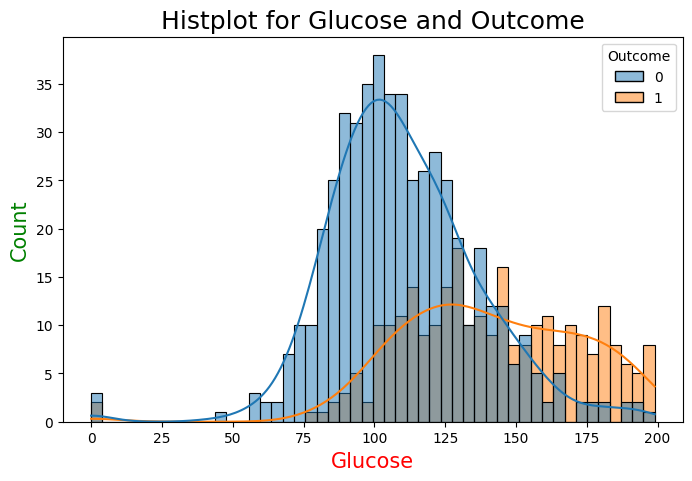

In [76]:
plt.figure(figsize=(8,5))
sns.histplot(x="Glucose" , data=df , kde=True , bins=50 , hue="Outcome")
plt.title("Histplot for Glucose and Outcome" , fontsize = 18 , c="k")
plt.xlabel("Glucose" , fontsize = 15 , c="r")
plt.ylabel("Count" , fontsize = 15 , c="g")
plt.show()

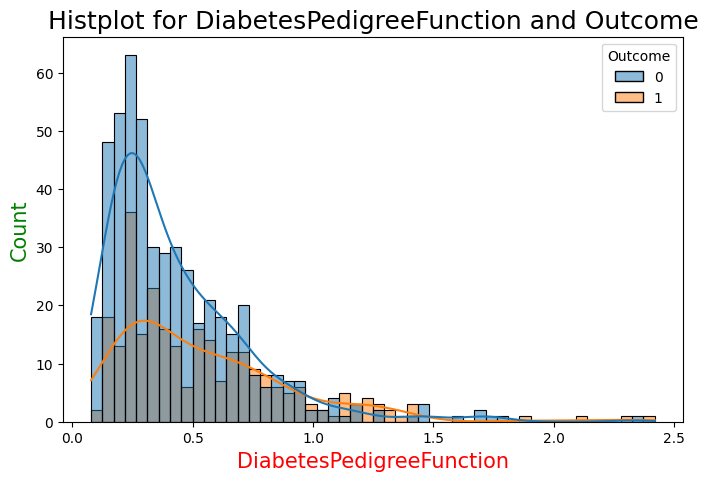

In [80]:
plt.figure(figsize=(8,5))
sns.histplot(x="DiabetesPedigreeFunction" , data=df , kde=True , bins=50 , hue="Outcome")
plt.title("Histplot for DiabetesPedigreeFunction and Outcome" , fontsize = 18 , c="k")
plt.xlabel("DiabetesPedigreeFunction" , fontsize = 15 , c="r")
plt.ylabel("Count" , fontsize = 15 , c="g")
plt.show()

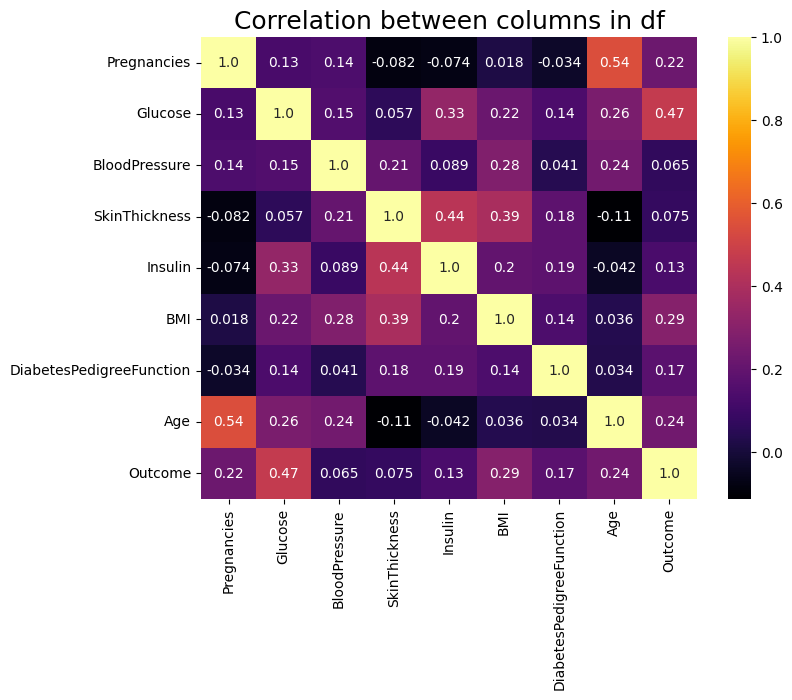

In [85]:
plt.figure(figsize = (8,6))
sns.heatmap(df_corr , annot = True , fmt=".2" , cmap ="inferno")
plt.title("Correlation between columns in df" , fontsize = 18 , c="k")
plt.show()

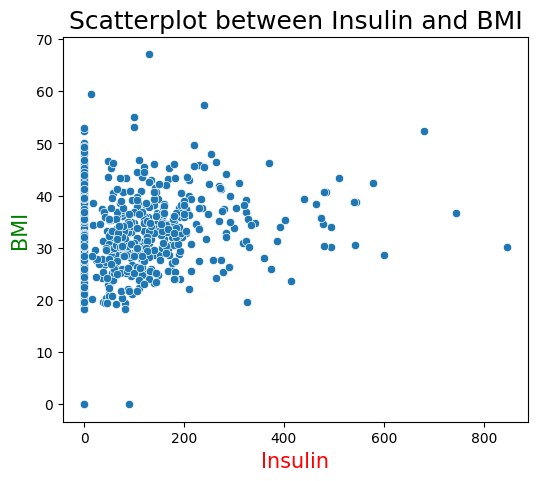

In [89]:
plt.figure(figsize = (6,5))
sns.scatterplot(x = df["Insulin"] , y = df["BMI"])
plt.title("Scatterplot between Insulin and BMI" , fontsize = 18 , c="k")
plt.xlabel("Insulin" , fontsize = 15 , c="r")
plt.ylabel("BMI" , fontsize = 15 , c="g")
plt.show()

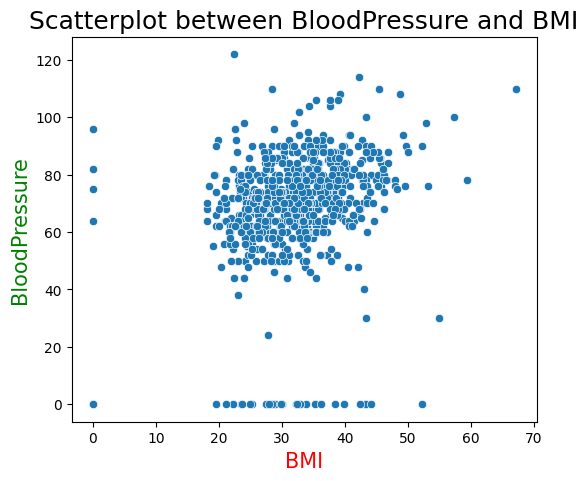

In [92]:
plt.figure(figsize = (6,5))
sns.scatterplot(x = df["BMI"] , y = df["BloodPressure"])
plt.title("Scatterplot between BloodPressure and BMI" , fontsize = 18 , c="k")
plt.xlabel("BMI" , fontsize = 15 , c="r")
plt.ylabel("BloodPressure" , fontsize = 15 , c="g")
plt.show()

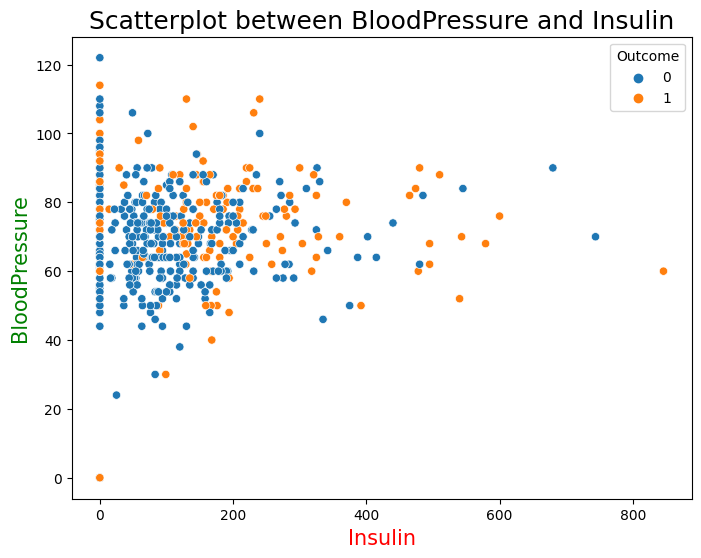

In [100]:
plt.figure(figsize = (8,6))
sns.scatterplot(x = df["Insulin"] , y = df["BloodPressure"] , hue ="Outcome" , data=df)
plt.title("Scatterplot between BloodPressure and Insulin" , fontsize = 18 , c="k")
plt.xlabel("Insulin" , fontsize = 15 , c="r")
plt.ylabel("BloodPressure" , fontsize = 15 , c="g")
plt.show()

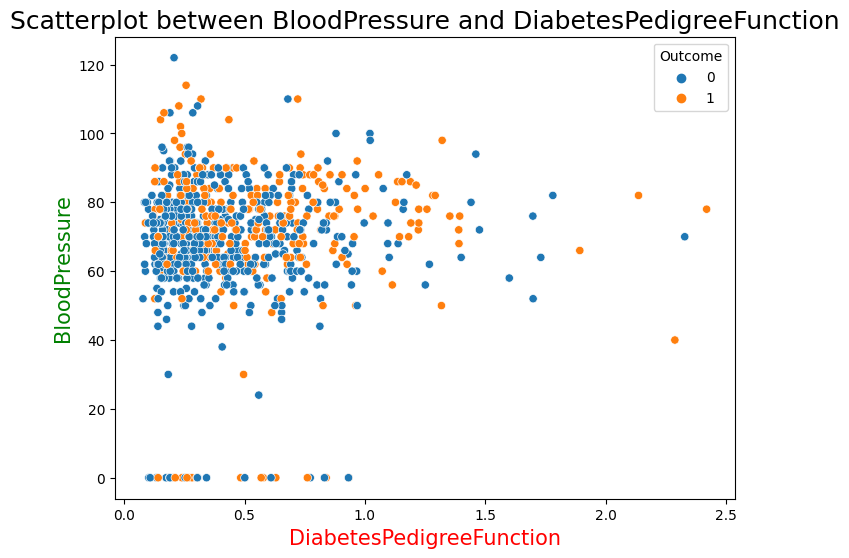

In [99]:
plt.figure(figsize = (8,6))
sns.scatterplot(x = df["DiabetesPedigreeFunction"] , y = df["BloodPressure"] , hue ="Outcome" , data=df)
plt.title("Scatterplot between BloodPressure and DiabetesPedigreeFunction" , fontsize = 18 , c="k")
plt.xlabel("DiabetesPedigreeFunction" , fontsize = 15 , c="r")
plt.ylabel("BloodPressure" , fontsize = 15 , c="g")
plt.show()

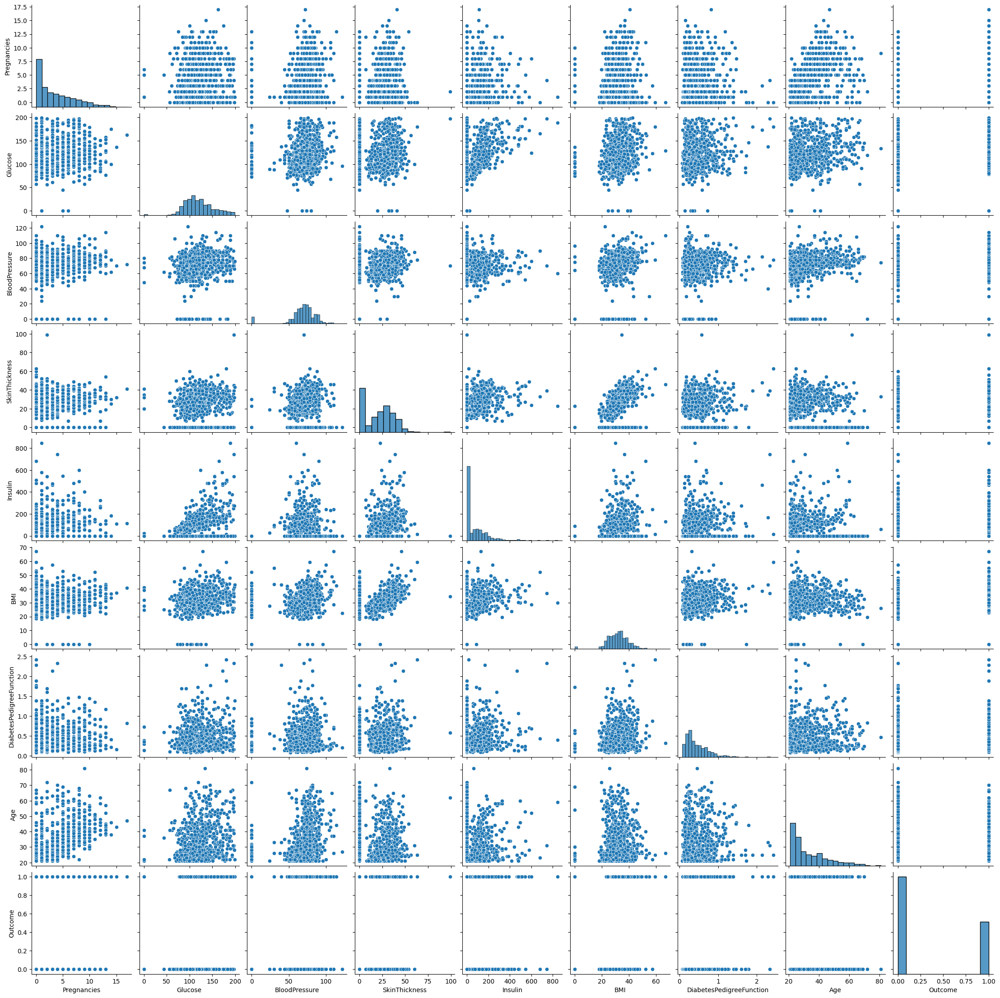

In [105]:
sns.pairplot(df)
plt.show()

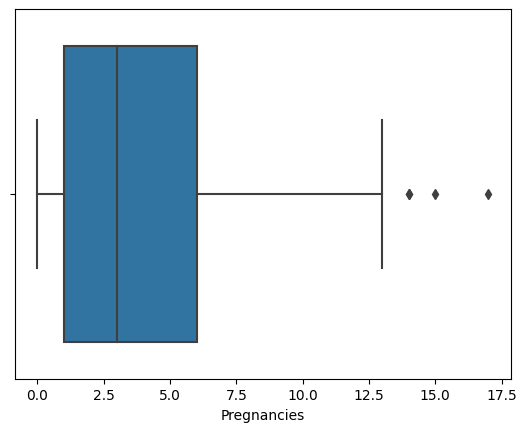

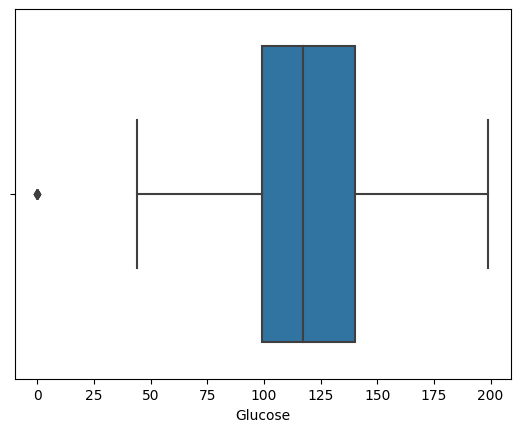

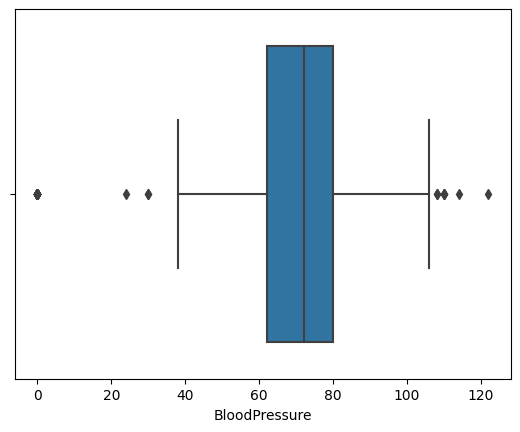

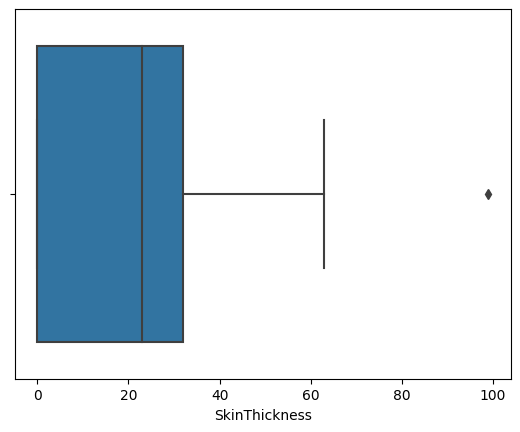

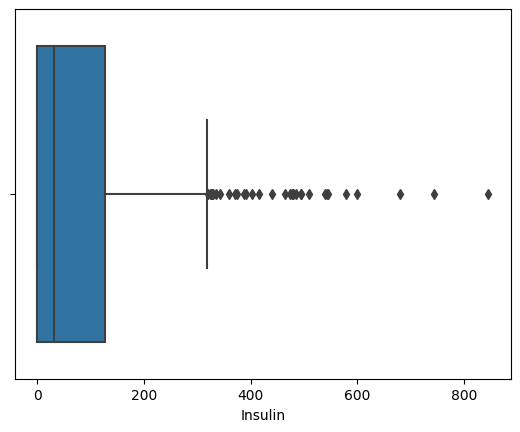

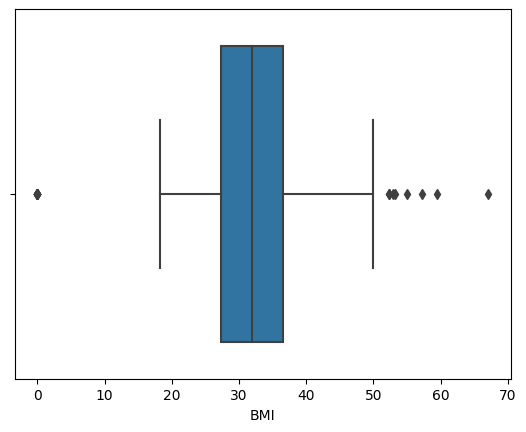

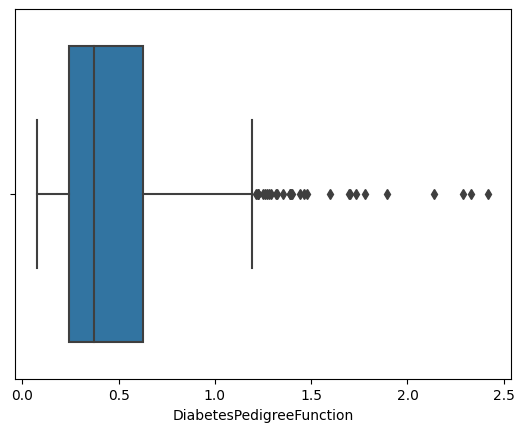

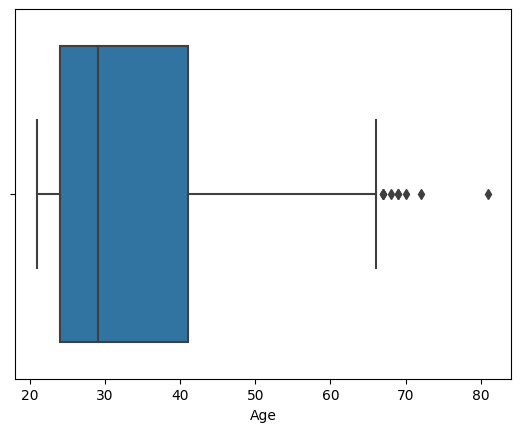

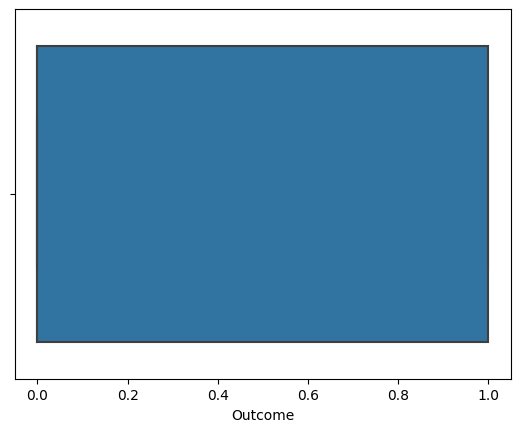

In [128]:
for i in df:
    sns.boxplot(x=df[i])
    plt.show()

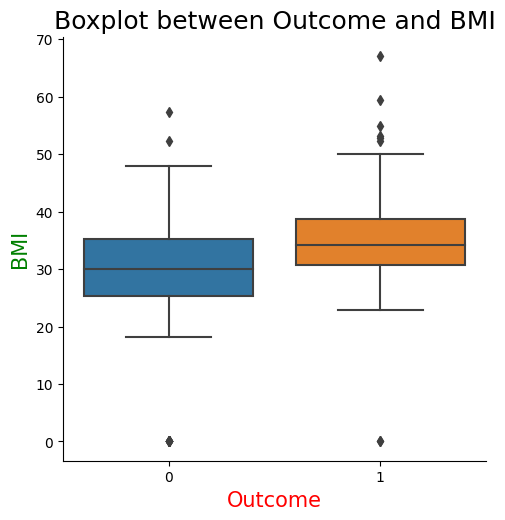

In [135]:
sns.catplot(x="Outcome" , data = df , y = "BMI" , kind = "box")
plt.title("Boxplot between Outcome and BMI" , fontsize = 18 , c="k")
plt.xlabel("Outcome" , fontsize = 15 , c="r")
plt.ylabel("BMI" , fontsize = 15 , c="g")
plt.show()

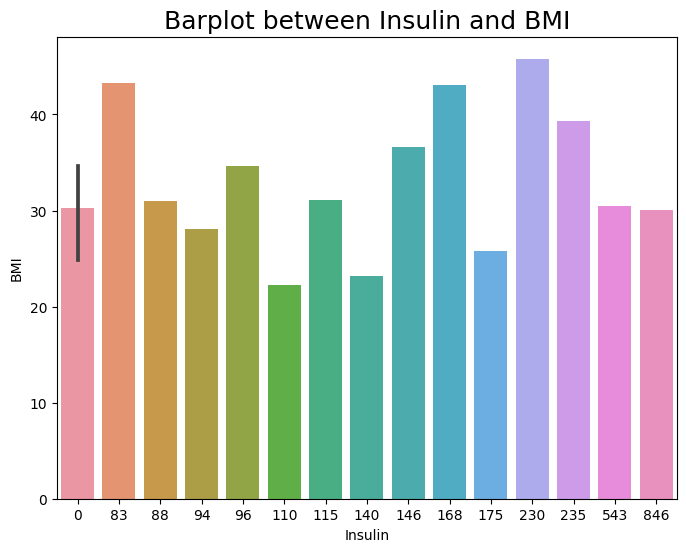

In [142]:
plt.figure(figsize = (8,6))
sns.barplot(data = df[2:30] , x="Insulin" , y="BMI")
plt.title("Barplot between Insulin and BMI" , fontsize = 18 , c="k")
plt.show()

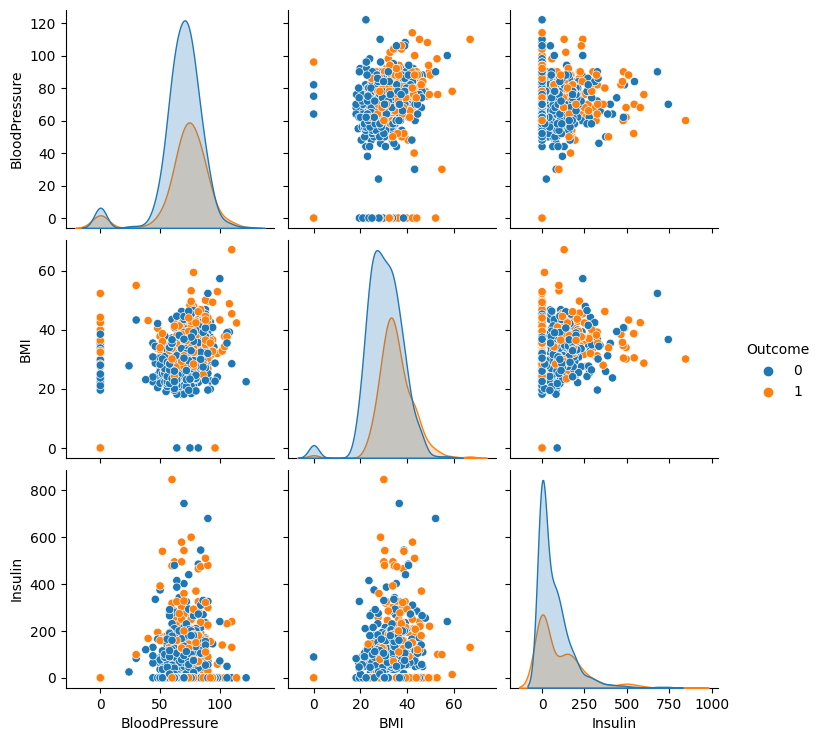

In [144]:
sns.pairplot(df , vars = ["BloodPressure" , "BMI" , "Insulin"] , hue = "Outcome")
plt.show()

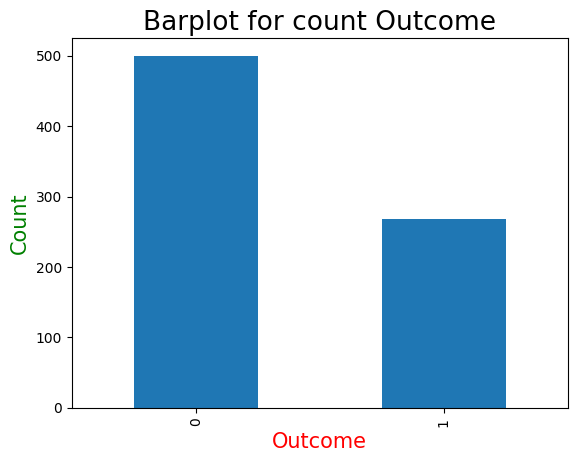

In [147]:
df.Outcome.value_counts().tail(10).plot(kind = "bar")
plt.title("Barplot for count Outcome" , fontsize = 19 , c="k")
plt.xlabel("Outcome" , fontsize = 15 , c="r")
plt.ylabel("Count" , fontsize = 15 , c="g")
plt.show()

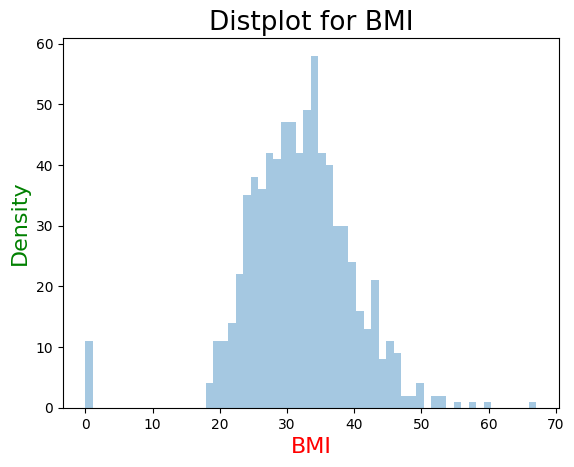

In [157]:
sns.distplot(df["BMI"] , bins = 60 , kde = False)
plt.title("Distplot for BMI" , fontsize = 19 , c="k")
plt.xlabel("BMI" , fontsize = 16 , c="r")
plt.ylabel("Density" , fontsize = 16 , c="g")
plt.show()

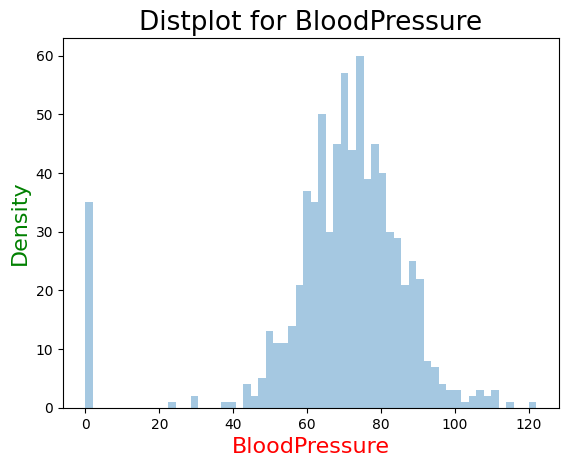

In [158]:
sns.distplot(df["BloodPressure"] , bins = 60 , kde = False)
plt.title("Distplot for BloodPressure" , fontsize = 19 , c="k")
plt.xlabel("BloodPressure" , fontsize = 16 , c="r")
plt.ylabel("Density" , fontsize = 16 , c="g")
plt.show()

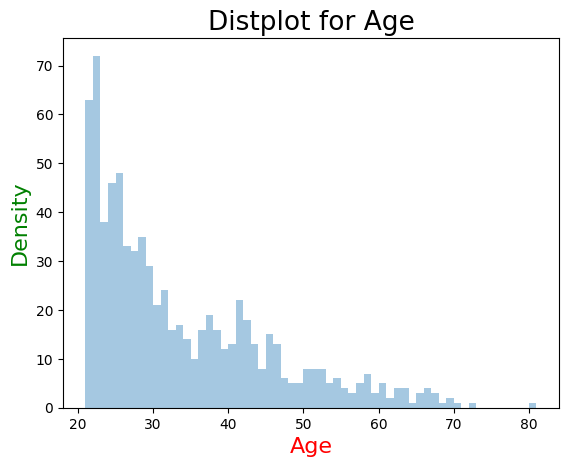

In [197]:
sns.distplot(df["Age"] , bins = 60 , kde = False )
plt.title("Distplot for Age" , fontsize = 19 , c="k")
plt.xlabel("Age" , fontsize = 16 , c="r")
plt.ylabel("Density" , fontsize = 16 , c="g")
plt.show()

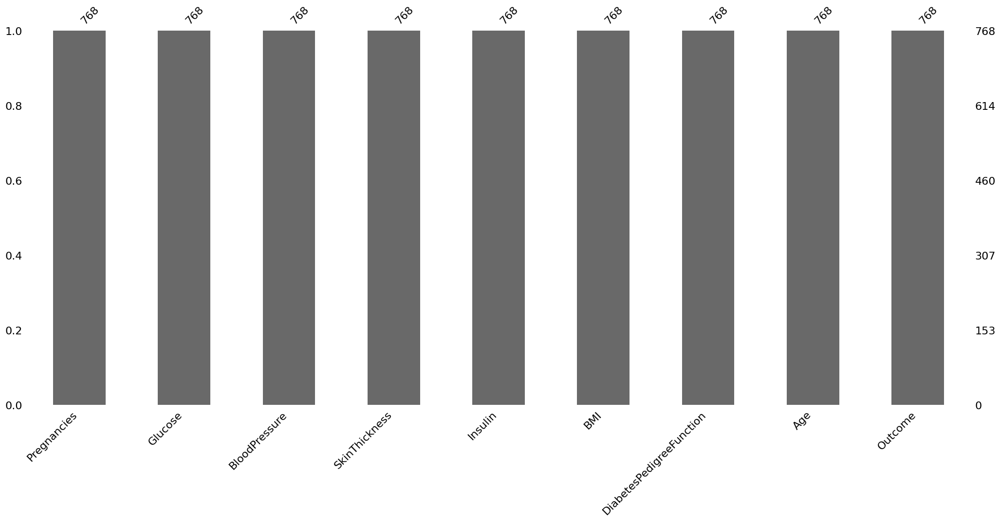

In [162]:
msno.bar(df)
plt.show()

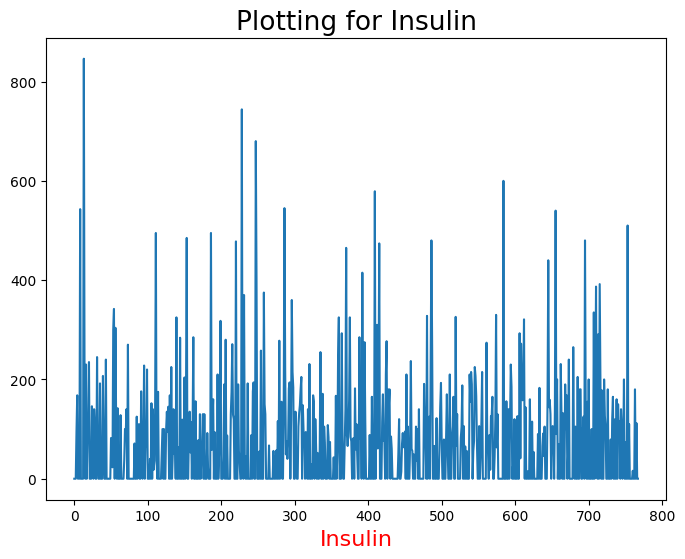

In [168]:
plt.figure(figsize = (8,6))
df["Insulin"].plot()
plt.title("Plotting for Insulin" , fontsize = 19 , c="k")
plt.xlabel("Insulin" , fontsize = 16 , c="r")
plt.show()

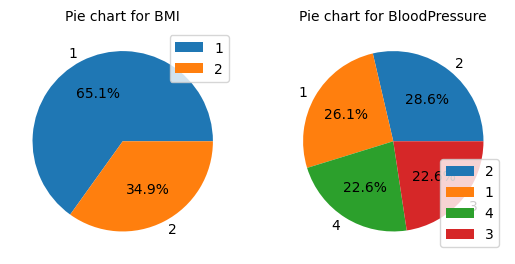

In [176]:
y1 = df["Outcome"].value_counts()
labels = ["1" , "2"]
plt.subplot(1,2,1)
plt.pie(y1 , labels = labels , autopct = "%1.1f%%")
plt.legend()
plt.title("Pie chart for BMI" , fontsize = 10 , c="k")


y2 = df["BloodPressure"].value_counts().head(4)
labels = ["2" , "1" , "4" ,"3"]
plt.subplot(1,2,2)
plt.pie(y2 , labels = labels , autopct = "%1.1f%%")
plt.legend()
plt.title("Pie chart for BloodPressure" , fontsize = 10 , c="k")


plt.show()

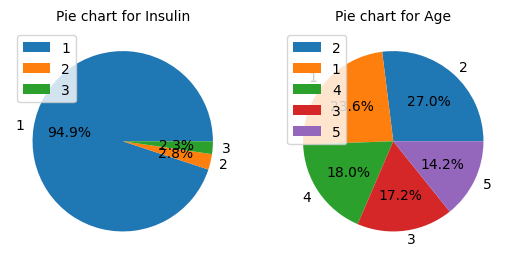

In [178]:
y1 = df["Insulin"].value_counts().head(3)
labels = ["1" , "2" , "3"]
plt.subplot(1,2,1)
plt.pie(y1 , labels = labels , autopct = "%1.1f%%")
plt.legend()
plt.title("Pie chart for Insulin" , fontsize = 10 , c="k")


y2 = df["Age"].value_counts().head(5)
labels = ["2" , "1" , "4" ,"3" ,"5"]
plt.subplot(1,2,2)
plt.pie(y2 , labels = labels , autopct = "%1.1f%%")
plt.legend()
plt.title("Pie chart for Age" , fontsize = 10 , c="k")


plt.show()

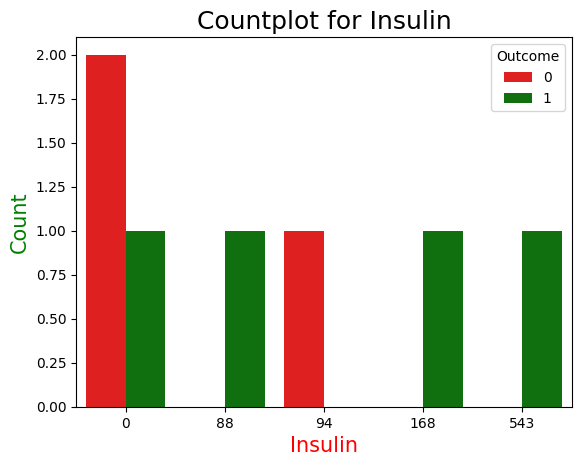

In [198]:
sns.countplot(x = "Insulin" , data = df[3:10] , hue = "Outcome" , palette=["r","g"])
plt.title("Countplot for Insulin" , fontsize = 18 , c="k")
plt.xlabel("Insulin" , fontsize = 15 , c="r")
plt.ylabel("Count" , fontsize = 15 , c="g")
plt.show()

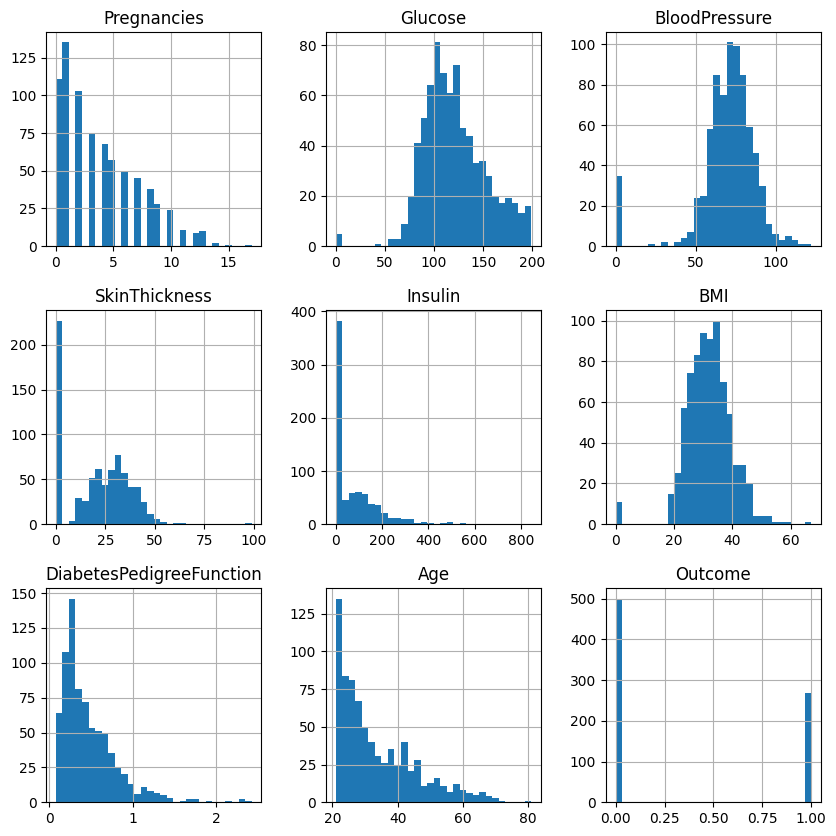

In [209]:
df.hist(bins = 30 , figsize = (10,10))
plt.show()

In [221]:
import plotly.io as pio
pio.renderers.default = "notebook"
import plotly.express as px
fig = px.histogram(df[12:22] , x="BMI" ,
                   color = "Outcome",width = 770 ,
                   height = 500)
fig.show()


In [224]:
import plotly.io as pio
pio.renderers.default = "notebook"
import plotly.express as px
fig = px.bar(df[12:28] , x="Glucose" ,
                   color = "BMI",width = 700 ,
                   height = 500)
fig.show()


In [225]:
import plotly.io as pio
pio.renderers.default = "notebook"
import plotly.express as px
fig = px.bar(df[12:30] , x="Age" ,
                   color = "Insulin",width = 700 ,
                   height = 500)
fig.show()


# SPlit Data

In [230]:
X = df.drop("Outcome" , axis = 1)
y = df["Outcome"]

In [231]:
X

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148,72,35,0,33.6,0.627,50
1,1,85,66,29,0,26.6,0.351,31
2,8,183,64,0,0,23.3,0.672,32
3,1,89,66,23,94,28.1,0.167,21
4,0,137,40,35,168,43.1,2.288,33
...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63
764,2,122,70,27,0,36.8,0.340,27
765,5,121,72,23,112,26.2,0.245,30
766,1,126,60,0,0,30.1,0.349,47


In [232]:
y

0      1
1      0
2      1
3      0
4      1
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 768, dtype: int64

In [234]:
x_train , x_test , y_train , y_test = train_test_split(X , y ,
                                                       random_state = 42 ,
                                                       shuffle = True,
                                                      test_size = 0.2)

In [235]:
print("x_train shape" , x_train.shape)
print("x_test shape" , x_test.shape)
print("y_train shape" , y_train.shape)
print("y_test shape" , y_test.shape)

x_train shape (614, 8)
x_test shape (154, 8)
y_train shape (614,)
y_test shape (154,)


#  RandomForestClassifier

In [252]:
rf = RandomForestClassifier(n_estimators = 10 ,
                           max_depth = 7,
                           max_features = 6)

rf.fit(x_train , y_train)

RandomForestClassifier(max_depth=7, max_features=6, n_estimators=10)

In [253]:
rf.score(x_train , y_train)

0.9364820846905537

In [254]:
y_pred_rf = rf.predict(x_test)
y_pred_rf

array([1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1,
       0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1,
       0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1,
       0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1,
       0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0])

In [255]:
accuracy_rf = accuracy_score(y_test , y_pred_rf)
print("accuracy_rf" , accuracy_rf)

accuracy_rf 0.7597402597402597


In [260]:
report = classification_report(y_test , y_pred_rf)
report

'              precision    recall  f1-score   support\n\n           0       0.82      0.81      0.81        99\n           1       0.66      0.67      0.67        55\n\n    accuracy                           0.76       154\n   macro avg       0.74      0.74      0.74       154\nweighted avg       0.76      0.76      0.76       154\n'

In [258]:
cm_rf = confusion_matrix(y_test , y_pred_rf)
cm_rf

array([[80, 19],
       [18, 37]])

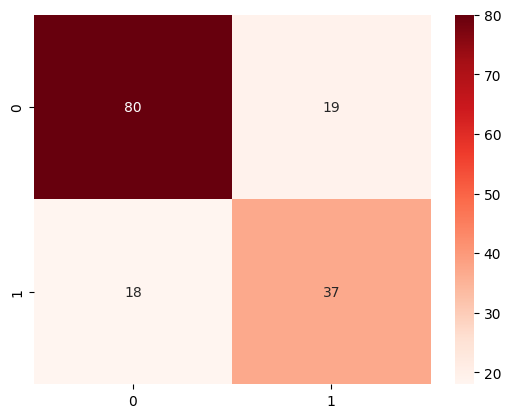

In [259]:
sns.heatmap(cm_rf , annot = True , cmap="Reds" )
plt.show()

In [264]:
mse_score_rf = cross_val_score(estimator = rf ,
                               X= x_train , 
                              y = y_train ,
                               cv = 6 ,
                               n_jobs = 4 ,
                              scoring = "neg_mean_squared_error")

mse_score_rf = -1 * mse_score_rf
mse_score_rf

array([0.26213592, 0.2038835 , 0.29411765, 0.21568627, 0.29411765,
       0.23529412])

In [265]:
## Tuning Hyperparameters with GridSearchCV

parms_test = {"n_estimators":[10 , 20 , 30 , 40] ,
             "max_features":[2 , 4 , 8 , 10],
             "max_depth":[11 , 13 , 14 , 18]}





grid_search = GridSearchCV(estimator = rf ,
                          param_grid = parms_test ,
                          cv = 7 ,
                          return_train_score = False)

In [266]:
grid_search.fit(x_train , y_train)

GridSearchCV(cv=7,
             estimator=RandomForestClassifier(max_depth=7, max_features=6,
                                              n_estimators=10),
             param_grid={'max_depth': [11, 13, 14, 18],
                         'max_features': [2, 4, 8, 10],
                         'n_estimators': [10, 20, 30, 40]})

In [267]:
## get best model hyperparameters

best_model = grid_search.best_estimator_
best_model

RandomForestClassifier(max_depth=14, max_features=2, n_estimators=20)

In [268]:
## get best score

best_score = grid_search.best_score_
best_score

0.7785117181668905

In [274]:
## Tuning with RandomizedSearchCV

parms_test = {"n_estimators":[20 , 40 , 60 , 80],
             "max_features":[10 , 20 , 30 , 40],
             "max_depth":[10 , 15 , 25 , 30]}





random_search = RandomizedSearchCV(estimator = rf ,
                                   param_distributions = parms_test,
                                  n_iter = 10 ,cv =7 ,
                                  random_state = 42)

In [275]:
random_search.fit(x_train , y_train)

RandomizedSearchCV(cv=7,
                   estimator=RandomForestClassifier(max_depth=14,
                                                    max_features=2,
                                                    n_estimators=20),
                   param_distributions={'max_depth': [10, 15, 25, 30],
                                        'max_features': [10, 20, 30, 40],
                                        'n_estimators': [20, 40, 60, 80]},
                   random_state=42)

In [276]:
## get best hyperparameters

best_model = random_search.best_estimator_
best_model

RandomForestClassifier(max_depth=15, max_features=10, n_estimators=20)

In [277]:
## get best score

best_score = random_search.best_score_
best_score

0.7670547842961637

# DicissionTreeClassifier

In [300]:
dt = DecisionTreeClassifier(random_state = 42,
                           max_features = 30,
                           max_depth = 2)


dt.fit(x_train , y_train)

DecisionTreeClassifier(max_depth=2, max_features=30, random_state=42)

In [301]:
dt.score(x_train , y_train)

0.7719869706840391

In [302]:
y_pred_dt = dt.predict(x_test)
y_pred_dt

array([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1,
       0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1,
       0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0])

In [303]:
accuracy_dt = accuracy_score(y_test , y_pred_dt)
print("accuracy_dt " , accuracy_dt)

accuracy_dt  0.7727272727272727


In [304]:
report = classification_report(y_test , y_pred_dt)
report

'              precision    recall  f1-score   support\n\n           0       0.79      0.88      0.83        99\n           1       0.73      0.58      0.65        55\n\n    accuracy                           0.77       154\n   macro avg       0.76      0.73      0.74       154\nweighted avg       0.77      0.77      0.77       154\n'

In [305]:
cm_dt = confusion_matrix(y_test , y_pred_dt)
cm_dt

array([[87, 12],
       [23, 32]])

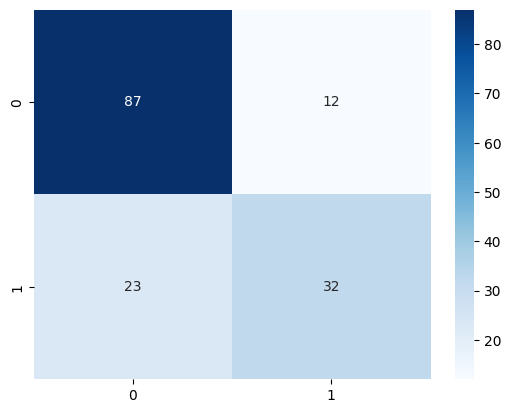

In [307]:
sns.heatmap(cm_dt , annot = True , cmap = "Blues")
plt.show()

In [309]:
mse_score_dt = cross_val_score(X = x_train ,
                              y = y_train , 
                              cv = 8 ,
                              n_jobs = 4 ,
                              estimator = dt ,
                              scoring = "neg_mean_squared_error")


mse_score_dt = -1 * mse_score_dt
mse_score_dt

array([0.33766234, 0.23376623, 0.16883117, 0.31168831, 0.16883117,
       0.31168831, 0.26315789, 0.18421053])

In [311]:
## Tuning with GridSearchCV

parms_test = {"max_features":[20 , 40 , 50 , 80],
             "max_depth":[13 , 26 , 54 , 70]}



grid_search = GridSearchCV(estimator = dt ,
                          cv = 7,
                          param_grid = parms_test ,
                          return_train_score = False)

In [312]:
grid_search.fit(x_train , y_train)

GridSearchCV(cv=7,
             estimator=DecisionTreeClassifier(max_depth=2, max_features=30,
                                              random_state=42),
             param_grid={'max_depth': [13, 26, 54, 70],
                         'max_features': [20, 40, 50, 80]})

In [313]:
## get best hyperparameters

best_model = grid_search.best_estimator_
best_model

DecisionTreeClassifier(max_depth=13, max_features=20, random_state=42)

In [314]:
## get best score

best_score = grid_search.best_score_
best_score

0.7085199283475144

In [317]:
## Tuning with RandomizedSearchCV

parms_test = {"max_features":[2 , 6 , 10 , 30],
             "max_depth":[12 , 20 , 30 , 40]}




random_search = RandomizedSearchCV(estimator = dt ,
                                  param_distributions = parms_test ,
                                  cv = 10,
                                  n_iter = 6)

In [318]:
random_search.fit(x_train , y_train)

RandomizedSearchCV(cv=10,
                   estimator=DecisionTreeClassifier(max_depth=2,
                                                    max_features=30,
                                                    random_state=42),
                   n_iter=6,
                   param_distributions={'max_depth': [12, 20, 30, 40],
                                        'max_features': [2, 6, 10, 30]})

In [319]:
## get best hyperparameters

best_model = random_search.best_estimator_
best_model

DecisionTreeClassifier(max_depth=12, max_features=6, random_state=42)

In [320]:
## get best score

best_score = random_search.best_score_
best_score

0.7376520359598097

# SVM

In [325]:
clf = SVC(kernel = "rbf" , C=0.9)
clf.fit(x_train , y_train)

SVC(C=0.9)

In [326]:
clf.score(x_train , y_train)

0.7703583061889251

In [327]:
y_pred_clf = clf.predict(x_test)
y_pred_clf

array([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0,
       0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1,
       0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0])

In [328]:
accuracy_clf = accuracy_score(y_test , y_pred_clf)
print("accuracy_clf" , accuracy_clf)

accuracy_clf 0.7662337662337663


In [329]:
report = classification_report(y_test , y_pred_clf)
report

'              precision    recall  f1-score   support\n\n           0       0.78      0.88      0.83        99\n           1       0.72      0.56      0.63        55\n\n    accuracy                           0.77       154\n   macro avg       0.75      0.72      0.73       154\nweighted avg       0.76      0.77      0.76       154\n'

In [330]:
cm_clf = confusion_matrix(y_test , y_pred_clf)
cm_clf

array([[87, 12],
       [24, 31]])

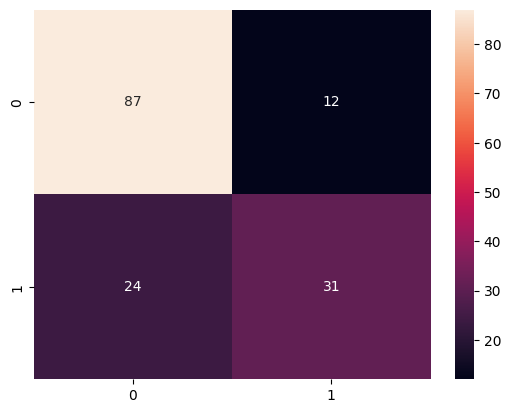

In [331]:
sns.heatmap(cm_clf , annot = True)
plt.show()

In [332]:
mse_score_clf = cross_val_score(X = x_train , 
                               y = y_train ,
                               cv = 9,
                               n_jobs = 5,
                               scoring = "neg_mean_squared_error",
                               estimator = clf)

mse_score_clf = -1 * mse_score_clf
mse_score_clf

array([0.30434783, 0.23188406, 0.16176471, 0.26470588, 0.26470588,
       0.22058824, 0.29411765, 0.25      , 0.23529412])

# xgboost

In [353]:
xg = xgb.XGBClassifier(n_estimators = 3)
xg.fit(x_train , y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=3, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [354]:
xg.score(x_train , y_train)

0.8762214983713354

In [355]:
y_pred_xg = xg.predict(x_test)
y_pred_xg

array([0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1,
       0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1,
       0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1,
       1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1,
       0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0,
       0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0])

In [356]:
accuracy_xg = accuracy_score(y_test , y_pred_xg)
print("accuracy_xg" , accuracy_xg)

accuracy_xg 0.7532467532467533


In [357]:
report = classification_report(y_test , y_pred_xg)
report

'              precision    recall  f1-score   support\n\n           0       0.80      0.83      0.81        99\n           1       0.67      0.62      0.64        55\n\n    accuracy                           0.75       154\n   macro avg       0.73      0.72      0.73       154\nweighted avg       0.75      0.75      0.75       154\n'

In [358]:
cm_xg = confusion_matrix(y_test , y_pred_xg)
cm_xg

array([[82, 17],
       [21, 34]])

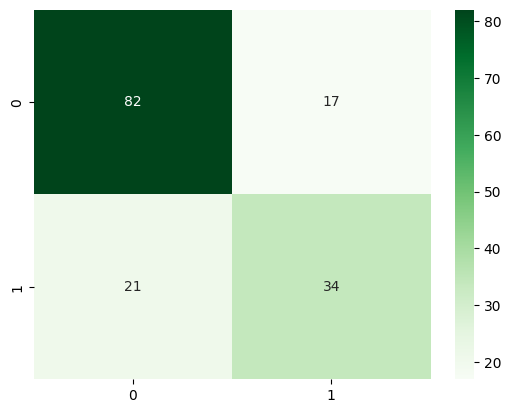

In [359]:
sns.heatmap(cm_xg , annot = True , cmap = "Greens")
plt.show()

In [360]:
mse_score_xg = cross_val_score(X = x_train,
                              y = y_train ,
                              cv = 7 ,
                              estimator = xg,
                              scoring = "neg_mean_squared_error")

mse_score_xg = -1 * mse_score_xg
mse_score_xg

array([0.29545455, 0.22727273, 0.29545455, 0.25      , 0.26136364,
       0.26436782, 0.25287356])

# AdaBoostClassifier

In [370]:
adaboost = AdaBoostClassifier(base_estimator = dt ,
                             n_estimators = 4,
                             random_state = 42)

adaboost.fit(x_train , y_train)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=2,
                                                         max_features=30,
                                                         random_state=42),
                   n_estimators=4, random_state=42)

In [371]:
y_pred_a = adaboost.predict(x_test)
y_pred_a

array([1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1,
       0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1,
       0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1,
       0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1,
       0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0])

In [372]:
accuracy = accuracy_score(y_test , y_pred_a)
print("accuracy" , accuracy)

accuracy 0.7207792207792207


In [373]:
report = classification_report(y_test , y_pred_a)
report

'              precision    recall  f1-score   support\n\n           0       0.82      0.73      0.77        99\n           1       0.59      0.71      0.64        55\n\n    accuracy                           0.72       154\n   macro avg       0.70      0.72      0.71       154\nweighted avg       0.74      0.72      0.73       154\n'

# VotingClassifier

In [377]:
vot = VotingClassifier(estimators = [("rf" ,rf) , ("dt" , dt) ] , voting = "soft")
vot.fit(x_train , y_train)

VotingClassifier(estimators=[('rf',
                              RandomForestClassifier(max_depth=14,
                                                     max_features=2,
                                                     n_estimators=20)),
                             ('dt',
                              DecisionTreeClassifier(max_depth=2,
                                                     max_features=30,
                                                     random_state=42))],
                 voting='soft')

In [379]:
vot.score(x_train , y_train)

0.9234527687296417

In [380]:
y_pred_vot = vot.predict(x_test)
y_pred_vot

array([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0,
       0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1,
       0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1,
       0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1,
       0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0])

In [381]:
accuracy = accuracy_score(y_test , y_pred_vot)
print("accuracy" , accuracy)

accuracy 0.7727272727272727


In [382]:
report = classification_report(y_test , y_pred_vot)
report

'              precision    recall  f1-score   support\n\n           0       0.80      0.87      0.83        99\n           1       0.72      0.60      0.65        55\n\n    accuracy                           0.77       154\n   macro avg       0.76      0.73      0.74       154\nweighted avg       0.77      0.77      0.77       154\n'

# By : Jana Ashraf